In [1]:
import numpy as np
import xarray as xr

import matplotlib.pyplot as plt
import cartopy as cart
from scipy import stats
import tqdm
import scipy
from scipy.interpolate import griddata
import cmocean as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.axes as maxes

import warnings


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%config InlineBackend.figure_format = 'retina'

# Load in the data

In [2]:
mesh = xr.open_dataset("/storage2/shared/oceanparcels/input_data/MOi/domain_ORCA0083-N006/PSY4V3R1_mesh_hgr.nc").isel(t=0)

In [3]:
def prep_ds(ds):
    time = ds.isel(trajectory=0).time
    ds["time"] = time
    
    return ds.set_coords("time")

In [4]:
data_dir = "/nethome/4302001/output_data/backtracking/moi/"
ds_2d_forward = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_forward_init_2015-02-01_T180.nc")).load()
ds_2d_backward_180 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_backward_init_T180.nc")).load()
ds_2d_backward_90 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_backward_init_T90.nc")).load()
ds_2d_backward_30 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_backward_init_T30.nc")).load()
ds_2d_backward_10 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_backward_init_T10.nc")).load()
# ds_2d_forward = ds_2d_forward.isel(obs=slice(0, 181))

In [5]:
data_dir = "/nethome/4302001/output_data/backtracking/moi/"
ds_3d_forward = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_3D_forward_init_2015-02-01_T180_dt600.nc")).load()
ds_3d_backward_180 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_3D_backward_init_T180_dt-600.nc")).load()
ds_3d_backward_90 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_3D_backward_init_T90_dt-600.nc")).load()
ds_3d_backward_30 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_3D_backward_init_T30_dt-600.nc")).load()
ds_3d_backward_10 = prep_ds(xr.open_dataset(data_dir + "MOi_divergence_NA12_3D_backward_init_T10_dt-600.nc")).load()
ds_3d_forward = ds_3d_forward.isel(obs=slice(0, 181))

In [6]:
assert np.all(ds_2d_backward_180.lon.isel(obs=0).values == ds_2d_forward.lon.isel(obs=-1).values)
assert np.all(ds_2d_backward_180.lat.isel(obs=0).values == ds_2d_forward.lat.isel(obs=-1).values)

In [7]:
assert np.all(ds_2d_backward_90.lon.isel(obs=0).values == ds_2d_forward.lon.isel(obs=90).values)
assert np.all(ds_2d_backward_90.lat.isel(obs=0).values == ds_2d_forward.lat.isel(obs=90).values)

In [8]:
assert np.all(ds_2d_backward_30.lon.isel(obs=0).values == ds_2d_forward.lon.isel(obs=30).values)
assert np.all(ds_2d_backward_30.lat.isel(obs=0).values == ds_2d_forward.lat.isel(obs=30).values)

In [9]:
assert np.all(ds_3d_backward_180.lon.isel(obs=0).values == ds_3d_forward.lon.isel(obs=-1).values)
assert np.all(ds_3d_backward_180.lat.isel(obs=0).values == ds_3d_forward.lat.isel(obs=-1).values)

In [10]:
lons = np.arange(-180, 180, 1)
lats = np.arange(-90, 90, 1)
LONS, LATS = np.meshgrid(lons, lats)

In [11]:
ds_2d_forward_nocoast = ds_2d_forward.isel(trajectory=(ds_2d_forward.isel(obs=0).drop('obs').coastal == 0))
ds_2d_backward_180_nocoast = ds_2d_backward_180.sel(trajectory=ds_2d_forward_nocoast.trajectory.values)
ds_2d_backward_90_nocoast = ds_2d_backward_90.isel(trajectory=ds_2d_forward_nocoast.trajectory.values)
ds_2d_backward_30_nocoast = ds_2d_backward_30.isel(trajectory=ds_2d_forward_nocoast.trajectory.values)
ds_2d_backward_10_nocoast = ds_2d_backward_10.isel(trajectory=ds_2d_forward_nocoast.trajectory.values)
ds_3d_forward_nocoast = ds_3d_forward.isel(trajectory=(ds_3d_forward.isel(obs=0).drop('obs').coastal == 0))
ds_3d_backward_180_nocoast = ds_3d_backward_180.sel(trajectory=ds_3d_forward_nocoast.trajectory.values)
ds_3d_backward_90_nocoast = ds_3d_backward_90.isel(trajectory=ds_3d_forward_nocoast.trajectory.values)
ds_3d_backward_30_nocoast = ds_3d_backward_30.isel(trajectory=ds_3d_forward_nocoast.trajectory.values)
ds_3d_backward_10_nocoast = ds_3d_backward_10.isel(trajectory=ds_3d_forward_nocoast.trajectory.values)

In [12]:
# Free up some memory
del ds_2d_forward
del ds_2d_backward_180
del ds_2d_backward_90
del ds_2d_backward_30
del ds_2d_backward_10
del ds_3d_forward
del ds_3d_backward_180
del ds_3d_backward_90
del ds_3d_backward_30
del ds_3d_backward_10


# Average maps

In [13]:
dir_avg = "/nethome/4302001/local_data/climatology/psy4v3r1/"

In [15]:
avg_derivatives = xr.open_dataset(dir_avg + "psy4v3r1-daily_derivatives_2015-01-01_2015-12-31.nc").load()

In [18]:
avg_2d = xr.open_dataset(dir_avg + "psy4v3r1-daily_2D_2015-01-01_2015-12-31.nc").load()

In [19]:
avg_divergence = (avg_derivatives.dudx + avg_derivatives.dvdy)
avg_curl = (avg_derivatives.dvdx - avg_derivatives.dudy)

In [21]:
avg_savd = np.abs(avg_derivatives['dudx']) + np.abs(avg_derivatives['dvdy']) + (np.abs(avg_derivatives['dvdx']) + np.abs(avg_derivatives['dudy'])).rename({'x_f': 'x_c', 'y_f': 'y_c'}).reindex_like(avg_derivatives['dudx'], method='backfill', tolerance=0.55)

In [22]:
divergence_subset = avg_divergence.isel(x_c=slice(2200, 4000), y_c=slice(500, 2800))
curl_subset = avg_curl.isel(x_f=slice(2200, 4000), y_f=slice(500, 2800))
savd_subset = avg_savd.isel(x_c=slice(2200, 4000), y_c=slice(500, 2800))
ssh_subset = avg_2d.sossheig.isel(x=slice(2200, 4000), y=slice(500, 2800)).rename({'x': 'x_c', 'y': 'y_c'})

In [23]:
mesh_subset = mesh.isel(x=slice(2200, 4000), y=slice(500, 2800))

In [25]:
div_robust = max(np.abs(np.nanpercentile(divergence_subset.values, 98)), np.abs(np.nanpercentile(divergence_subset.values, 2)))
curl_robust =  max(np.abs(np.nanpercentile(curl_subset.values, 98)), np.abs(np.nanpercentile(curl_subset.values, 2)))
savd_robust = np.nanpercentile(savd_subset.values, 98)

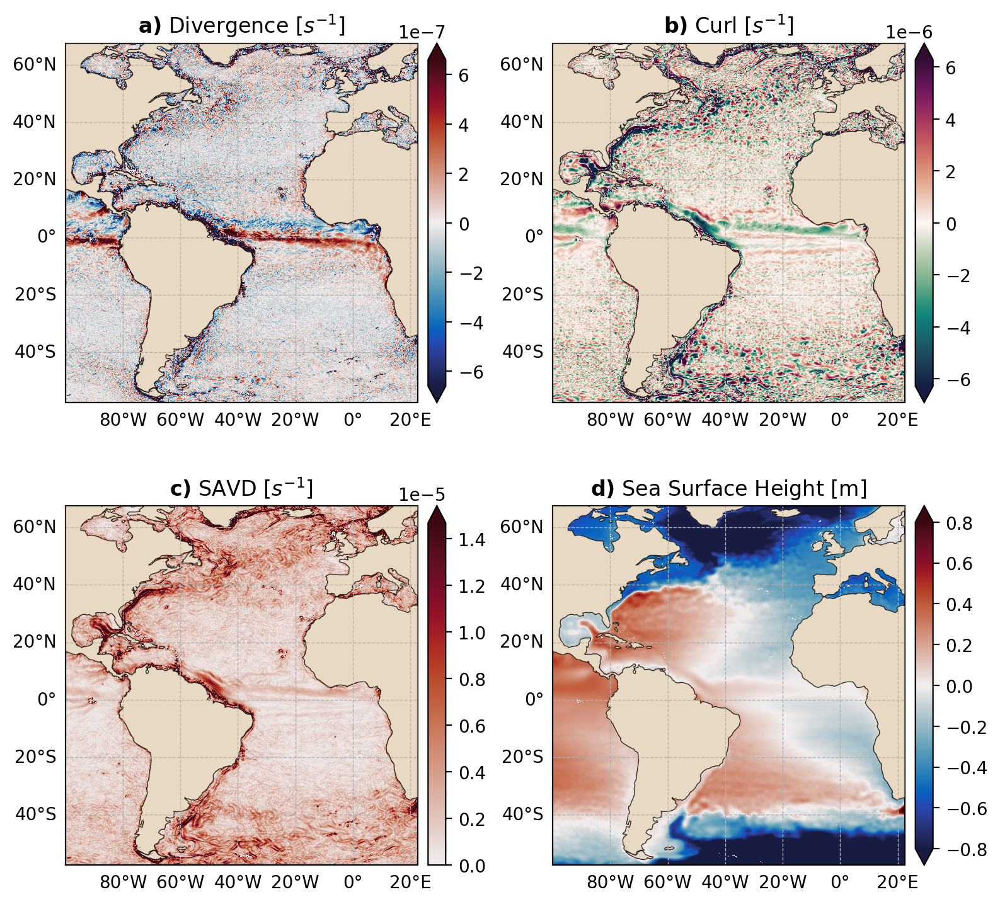

In [26]:
data_to_plot = [(divergence_subset, div_robust, r"$\bf{a)}$ " + "Divergence [$s^{-1}$]", cm.cm.balance),
                (curl_subset, curl_robust, r"$\bf{b)}$ " + "Curl [$s^{-1}$]", cm.cm.curl),
                (savd_subset, (0, savd_robust), r"$\bf{c)}$ " + "SAVD [$s^{-1}$]", cm.cm.amp),
                (ssh_subset, 0.8, r"$\bf{d)}$ " + "Sea Surface Height [m]", cm.cm.balance)]

fig, axes = plt.subplots(2, 2, figsize=(8, 7.5), subplot_kw={'projection': cart.crs.PlateCarree()})

for i, ax in enumerate(axes.flatten()):
    ax.coastlines(color='black', linewidth=0.5)
    ax.add_feature(cart.feature.LAND, zorder=10, facecolor='tan', alpha=0.5)
    ax.gridlines(draw_labels=["left", "bottom"], linewidth=0.5, linestyle='--')
    ax.set_extent([-100, 22.5, -57.5, 67.5], crs=cart.crs.PlateCarree())

    data, robust, label, cmap = data_to_plot[i]
    if type(robust) == tuple:
        vmin = robust[0]
        vmax = robust[1]
    else:
        vmin = -robust
        vmax = robust
    field = ax.pcolormesh(mesh_subset.glamt.values, mesh_subset.gphit.values, data.values, transform=cart.crs.PlateCarree(), vmin=vmin, vmax=vmax, cmap=cmap, label=label)
    
    ax.set_title(label)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad='3%', axes_class=maxes.Axes)
    if vmin == 0:
        extend = 'max'
    else:
        extend = 'both'
    fig.colorbar(field, cax=cax, orientation='vertical', extend=extend)

plt.tight_layout()
plt.savefig("figures/avg_fields.png", dpi=300)
plt.show()


# Divergence histograms

In [28]:
FB_divergence_2d_forward_init = ds_2d_forward_nocoast.isel(obs=0).dudx_linear + ds_2d_forward_nocoast.isel(obs=0).dvdy_linear
FB_divergence_2d_backward_last = ds_2d_backward_180_nocoast.isel(obs=-1).dudx_linear + ds_2d_backward_180_nocoast.isel(obs=-1).dvdy_linear

In [29]:
FB_divergence_3d_forward_init = ds_3d_forward_nocoast.isel(obs=0).dudx_linear + ds_3d_forward_nocoast.isel(obs=0).dvdy_linear
FB_divergence_3d_backward_last = ds_3d_backward_180_nocoast.isel(obs=-1).dudx_linear + ds_3d_backward_180_nocoast.isel(obs=-1).dvdy_linear

In [31]:
BF_divergence_2d_backward_init = xr.open_dataset("arrays/BF_divergence_2d_backward_init.nc").__xarray_dataarray_variable__.load()
BF_divergence_2d_forward_last = xr.open_dataset("arrays/BF_divergence_2d_forward_last.nc").__xarray_dataarray_variable__.load()

BF_divergence_3d_backward_init = xr.open_dataset("arrays/BF_divergence_3d_backward_init.nc").__xarray_dataarray_variable__.load()
BF_divergence_3d_forward_last = xr.open_dataset("arrays/BF_divergence_3d_forward_last.nc").__xarray_dataarray_variable__.load()

In [35]:
print(f"{np.nanpercentile(FB_divergence_2d_forward_init, 99.9)= }")
print(f"{np.nanpercentile(FB_divergence_2d_backward_last, 0.1)= }")
print(f"{np.nanpercentile(FB_divergence_3d_forward_init, 99.9)= }")
print(f"{np.nanpercentile(FB_divergence_3d_backward_last, 0.1)= }")

np.nanpercentile(FB_divergence_2d_forward_init, 99.9)= 1.1606013595155685e-05
np.nanpercentile(FB_divergence_2d_backward_last, 0.1)= -1.2193115937407129e-05
np.nanpercentile(FB_divergence_3d_forward_init, 99.9)= 1.1606013595155685e-05
np.nanpercentile(FB_divergence_3d_backward_last, 0.1)= -1.2748803736030823e-05


In [37]:
mean_divergence_2d_forward_init = np.mean(FB_divergence_2d_forward_init.values)
mean_divergence_2d_backward_last = np.mean(FB_divergence_2d_backward_last.values)
std_divergence_2d_forward_init = np.std(FB_divergence_2d_forward_init.values)
std_divergence_2d_backward_last = np.std(FB_divergence_2d_backward_last.values)
skew_divergence_2d_forward_init = scipy.stats.skew(FB_divergence_2d_forward_init.values)
skew_divergence_2d_backward_last = scipy.stats.skew(FB_divergence_2d_backward_last.values)

print(f"True: mean: {mean_divergence_2d_forward_init} (± {std_divergence_2d_forward_init}), skew: {skew_divergence_2d_forward_init}\nBacktracked: mean: {mean_divergence_2d_backward_last} (± {std_divergence_2d_backward_last}), skew: {skew_divergence_2d_backward_last}")

True: mean: -4.024165445315475e-09 (± 1.5402310964418575e-06), skew: 1.4529647476999867
Backtracked: mean: 1.3484599037383305e-07 (± 1.6117447785291006e-06), skew: 2.2273394093661607


In [38]:
stats.ks_2samp(FB_divergence_2d_forward_init.values, FB_divergence_2d_backward_last.values)

KstestResult(statistic=0.04755625437680855, pvalue=0.0, statistic_location=-3.4816594e-10, statistic_sign=1)

In [39]:
stats.ks_2samp(FB_divergence_3d_forward_init.values, FB_divergence_3d_backward_last.values)

KstestResult(statistic=0.010092975525106906, pvalue=1.1828047112581266e-50, statistic_location=7.283661e-07, statistic_sign=1)

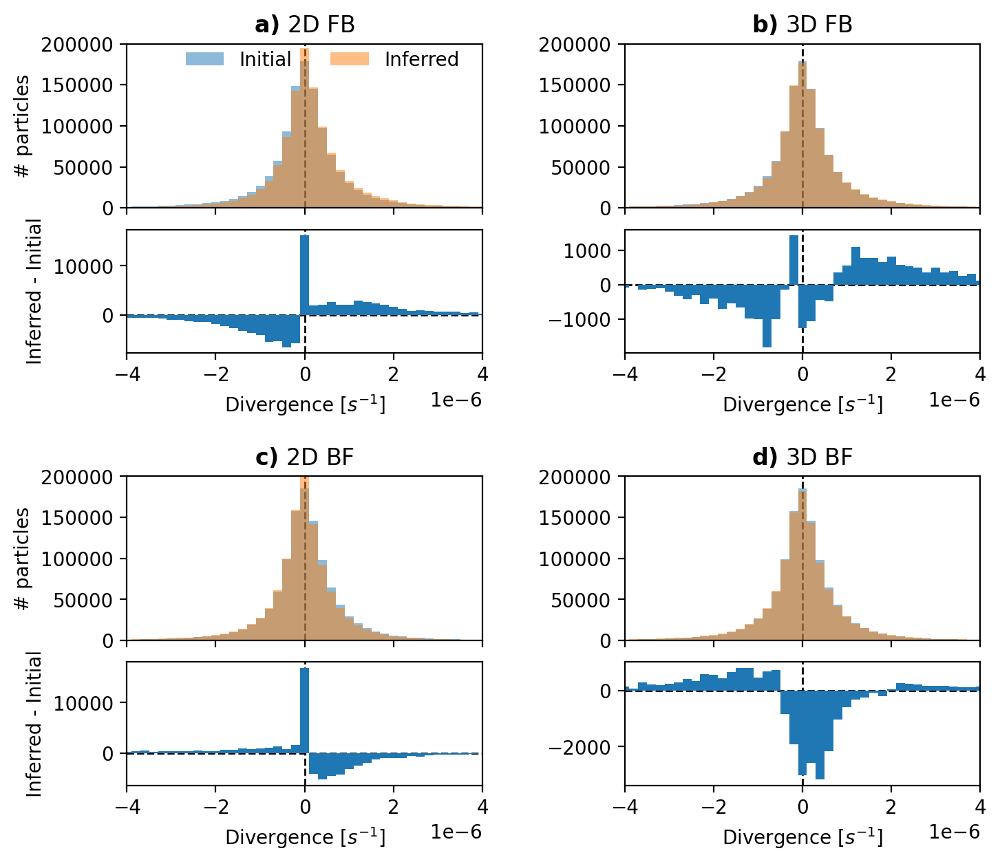

In [40]:
fig = plt.figure(figsize=(8, 7))

gs_outer = fig.add_gridspec(2, 2, hspace=0.4, wspace=0.4)

gs_BF_2d = gs_outer[0, 0].subgridspec(2, 1, hspace=0.15, height_ratios=[2, 1.5])
gs_BF_3d = gs_outer[0, 1].subgridspec(2, 1, hspace=0.15, height_ratios=[2, 1.5])
gs_FB_2d = gs_outer[1, 0].subgridspec(2, 1, hspace=0.15, height_ratios=[2, 1.5])
gs_FB_3d = gs_outer[1, 1].subgridspec(2, 1, hspace=0.15, height_ratios=[2, 1.5])

experiment_results = [(FB_divergence_2d_forward_init, FB_divergence_2d_backward_last, gs_BF_2d, r"$\bf{a)}$ 2D FB"),
                      (FB_divergence_3d_forward_init, FB_divergence_3d_backward_last, gs_BF_3d, r"$\bf{b)}$ 3D FB"),
                      (BF_divergence_2d_backward_init, BF_divergence_2d_forward_last, gs_FB_2d, r"$\bf{c)}$ 2D BF"),
                      (BF_divergence_3d_backward_init, BF_divergence_3d_forward_last, gs_FB_3d, r"$\bf{d)}$ 3D BF")]

for i, (divergence_fw, divergence_bw, gs, title) in enumerate(experiment_results):
    ax_top = fig.add_subplot(gs[0, 0])
    binwidth = 2e-7
    bins = np.arange(-6e-6 - 0.5 * binwidth, 6e-6 + 0.5 * binwidth, binwidth)
    hist_fw, bins = np.histogram(divergence_fw.values, bins=bins, density=False)
    hist_bw, bins = np.histogram(divergence_bw.values, bins=bins, density=False)
    ax_top.bar(bins[:-1], hist_fw, width=binwidth, alpha=0.5, label='Initial', align='edge')
    ax_top.bar(bins[:-1], hist_bw, width=binwidth, alpha=0.5, label='Inferred', align='edge')
    ax_top.set_title(title)
    ax_top.axvline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    # ax_top.set_xlim(-6e-6, 6e-6)
    ax_top.set_xlim(-4e-6, 4e-6)
    ax_top.set_xticklabels([])
    ax_top.set_ylim(0, 200000)
    if i == 0 or i==2:
        ax_top.set_ylabel("# particles")
    if i == 0:
        ax_top.legend(loc='center', bbox_to_anchor=(0.55, 0.9), ncols=2, framealpha=0.3, frameon=False)
        # ax_top.legend(loc='center', bbox_to_anchor=(0.5, 0), bbox_transform=fig.transFigure, ncols=2)

    ax_low = fig.add_subplot(gs[1, 0])
    ax_low.bar(bins[:-1], hist_bw-hist_fw, width=binwidth, align='edge')
    ax_low.axhline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    ax_low.axvline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    if i == 0 or i==2:
        ax_low.set_ylabel("Inferred - Initial")
    # ax_low.set_xlim(-6e-6, 6e-6)
    ax_low.set_xlim(-4e-6, 4e-6)
    ax_low.set_xlabel("Divergence [$s^{-1}$]")

plt.savefig("figures/atlantic_divergence_histograms.pdf", bbox_inches='tight')


# Plot on map

In [41]:
dx = dy = 1
lons = np.arange(-130, 61, dx)
lats = np.arange(-60, 81, dy)
LON, LAT = np.meshgrid(lons, lats)

lonsc = lons[:-1] + dx/2
latsc = lats[:-1] + dy/2
LONC, LATC = np.meshgrid(lonsc, latsc)

In [42]:
def countComparison(forward_init, backward_finit, LON, LAT):
    count_forward = np.histogram2d(forward_init.lon, forward_init.lat, bins=(lons, lats))[0]
    count_backward = np.histogram2d(backward_finit.lon, backward_finit.lat, bins=(lons, lats))[0]

    ratio = count_backward.T / count_forward.T
    lossgain = (count_backward.T - count_forward.T)/count_forward.max()

    lon_bindices_forward = np.digitize(forward_init.lon, lons[:-1]) - 1
    lat_bindices_forward = np.digitize(forward_init.lat, lats[:-1]) - 1
    lon_bindices_backward = np.digitize(backward_finit.lon, lons[:-1]) - 1
    lat_bindices_backward = np.digitize(backward_finit.lat, lats[:-1]) - 1

    flat_bin_indices_forward = lon_bindices_forward + lat_bindices_forward * (lons.size-1)
    flat_bin_indices_backward = lon_bindices_backward + lat_bindices_backward * (lons.size -1)

    same_bin = ((lon_bindices_forward == lon_bindices_backward) * (lat_bindices_forward == lat_bindices_backward))
    countgrid_bindices = np.arange(lons.size-1) + (lons.size-1) * np.arange(lats.size-1)[:, None]
    countgrid_bindices_flat = countgrid_bindices.flatten()

    counter_exact = np.zeros_like(countgrid_bindices_flat)

    for i, label in enumerate(flat_bin_indices_forward):
        if label == flat_bin_indices_backward[i]:
            counter_exact[label] += 1

    counter_exact_grid = counter_exact.reshape(lats.size-1, lons.size-1)
    counter_exact_grid = np.ma.masked_array(counter_exact_grid, mask=(count_forward==0).T)

    return count_forward, count_backward, ratio, lossgain, counter_exact_grid

In [43]:
exp_dict = {"2D": {"forward" : {"ds" : ds_2d_forward_nocoast},
                    "backward" : {180 : {"ds" : ds_2d_backward_180_nocoast},
                                    90: {"ds" : ds_2d_backward_90_nocoast},
                                    30: {"ds" : ds_2d_backward_30_nocoast}, 
                                    10: {"ds" : ds_2d_backward_10_nocoast}
                                    }
                                    }, 
            "3D": {"forward" : {"ds" : ds_3d_forward_nocoast},
                "backward" : {180 : {"ds" : ds_3d_backward_180_nocoast},
                                    90: {"ds" : ds_3d_backward_90_nocoast},
                                    30: {"ds" : ds_3d_backward_30_nocoast}, 
                                    10: {"ds" : ds_3d_backward_10_nocoast}
                                    }
                                    }}

In [44]:
exp_dict_BF = {"2D": {"forward" : {},
                    "backward" : {180 : {},
                                    90: {},
                                    30: {}, 
                                    10: {}
                                    }
                                    }, 
            "3D": {"forward" : {},
                "backward" : {180 : {},
                                    90: {},
                                    30: {}, 
                                    10: {}
                                    }
                                    }}

In [45]:
def haversine(lon1, lat1, lon2, lat2):
    R = 6371.0 #average
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    return R * c

In [47]:
def mean_distance_per_bin(forward_init, backward_finit, lons, lats):
    distance = haversine(forward_init.lon.values, forward_init.lat.values, backward_finit.lon.values, backward_finit.lat.values)

    lon_bindices_forward = np.digitize(forward_init.lon.values, lons[:-1]) - 1
    lat_bindices_forward = np.digitize(forward_init.lat.values, lats[:-1]) - 1

    flat_bin_indices_forward = lon_bindices_forward + lat_bindices_forward * (lons.size-1)

    countgrid_bindices = np.arange(lons.size-1) + (lons.size-1) * np.arange(lats.size-1)[:, None]
    countgrid_bindices_flat = countgrid_bindices.flatten()

    distances = np.zeros_like(countgrid_bindices_flat, dtype=np.float64)
    counter = np.zeros_like(countgrid_bindices_flat, dtype=np.float64)

    # Use np.bincount to accumulate distances and counts
    np.add.at(distances, flat_bin_indices_forward, distance)
    np.add.at(counter, flat_bin_indices_forward, 1)

    # To avoid division by zero, use np.where to replace zero counters with ones before division
    mean_distances = (distances / counter).reshape(lats.size-1, lons.size-1)

    return mean_distances

In [48]:
mean_distance_test = mean_distance_per_bin(ds_2d_forward_nocoast.isel(obs=0), ds_2d_backward_180_nocoast.isel(obs=-1), lons, lats)

/tmp/ipykernel_7268/967594165.py:20: RuntimeWarning: invalid value encountered in divide
  mean_distances = (distances / counter).reshape(lats.size-1, lons.size-1)


In [49]:
def interpolate_to_regular_grid(orig_lon, orig_lat, orig_data, new_lon = LONC, new_lat = LATC, method='linear'):
    points = np.column_stack((orig_lon.ravel(), orig_lat.ravel()))
    values = orig_data.values.ravel()

    grid_points = np.column_stack((new_lon.ravel(), new_lat.ravel()))

    interpolated_data = griddata(points, values, grid_points, method=method)

    interpolated_data = interpolated_data.reshape(new_lon.shape)

    return interpolated_data

In [52]:
def nan_corrcoef_with_mask(x, y):
    if np.ma.isMaskedArray(x):
        mask_x = ~x.mask * np.isfinite(x)
    else:
        mask_x = np.isfinite(x)

    if np.ma.isMaskedArray(y):
        mask_y = ~y.mask * np.isfinite(y)
    else:
        mask_y = np.isfinite(y)

    common_mask = mask_x & mask_y
    x = x[common_mask]
    y = y[common_mask]

    if len(x) == 0 or len(y) == 0:
        return np.nan  
    corr_matrix = np.corrcoef(x, y)

    corr = corr_matrix[0, 1] 

    return corr

In [53]:
for dimension in ["2D", "3D"]:
    for timescale in [180, 90, 30, 10]:
        print(f"{dimension=}, {timescale=}")
        dum, dum, ratio, lossgain, counter_exact_grid = countComparison(exp_dict[dimension]['forward']['ds'].isel(obs=0), exp_dict[dimension]['backward'][timescale]['ds'].isel(obs=-1), LON, LAT)
        exp_dict[dimension]['backward'][timescale]['ratio'] = ratio
        exp_dict[dimension]['backward'][timescale]['lossgain'] = lossgain
        exp_dict[dimension]['backward'][timescale]['counter_exact_grid'] = counter_exact_grid
        exp_dict[dimension]['backward'][timescale]['mean_distance'] = mean_distance_per_bin(exp_dict[dimension]['forward']['ds'].isel(obs=0), exp_dict[dimension]['backward'][timescale]['ds'].isel(obs=-1), lons, lats)

dimension='2D', timescale=180


/tmp/ipykernel_7268/3080205450.py:5: RuntimeWarning: divide by zero encountered in divide
  ratio = count_backward.T / count_forward.T
/tmp/ipykernel_7268/3080205450.py:5: RuntimeWarning: invalid value encountered in divide
  ratio = count_backward.T / count_forward.T
/tmp/ipykernel_7268/967594165.py:20: RuntimeWarning: invalid value encountered in divide
  mean_distances = (distances / counter).reshape(lats.size-1, lons.size-1)


dimension='2D', timescale=90
dimension='2D', timescale=30
dimension='2D', timescale=10
dimension='3D', timescale=180
dimension='3D', timescale=90
dimension='3D', timescale=30
dimension='3D', timescale=10


In [54]:
for dimension in ["2D", "3D"]:
    for timescale in [180, 90, 30, 10]:
        for quantity in ["ratio", "lossgain", "counter_exact_grid", "mean_distance"]:
            exp_dict_BF[dimension]['backward'][timescale][quantity] = np.load(f"arrays/{quantity}_BF_{dimension}_{timescale}.npy", allow_pickle=True)

In [55]:
exp_direction = [exp_dict, exp_dict_BF]
direction_names = ["FB", "BF"]
labels = ["a)", "b)", "c)", "d)"]

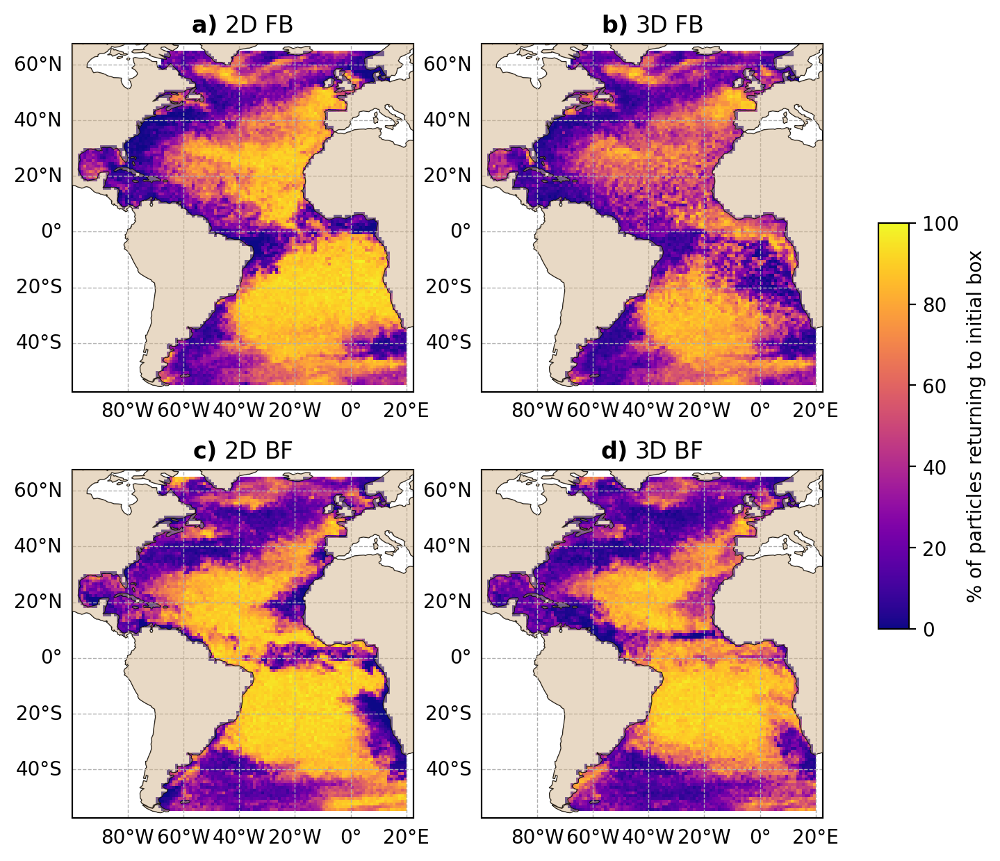

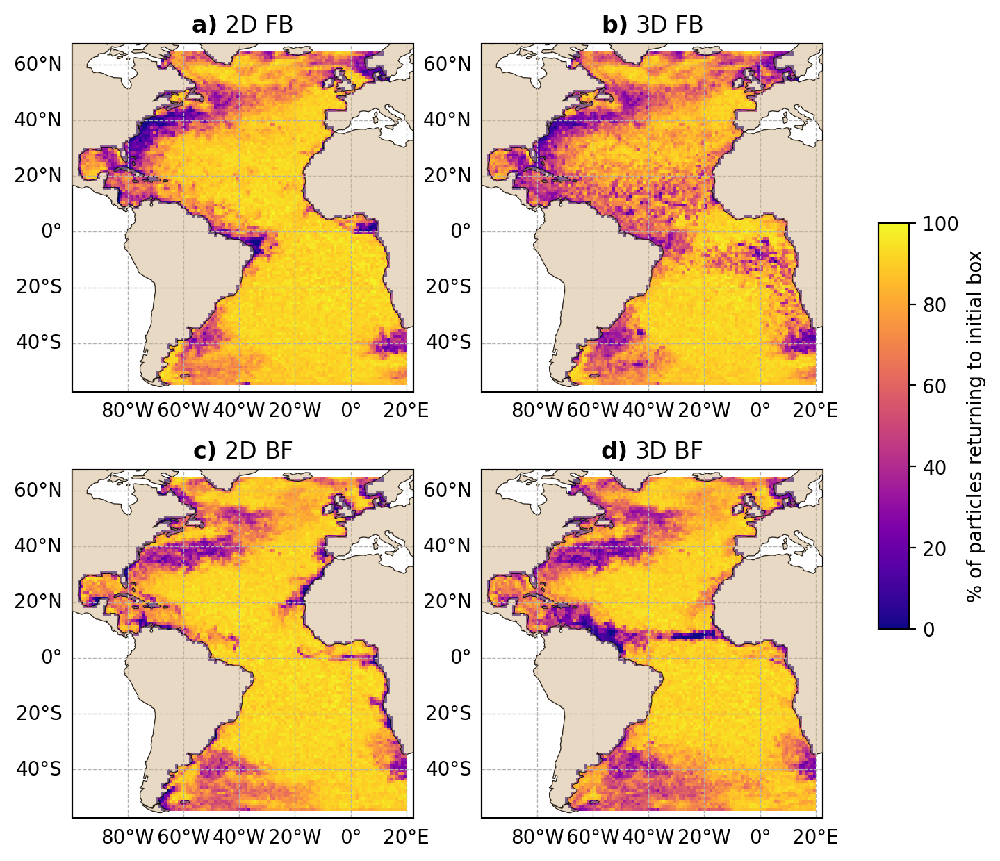

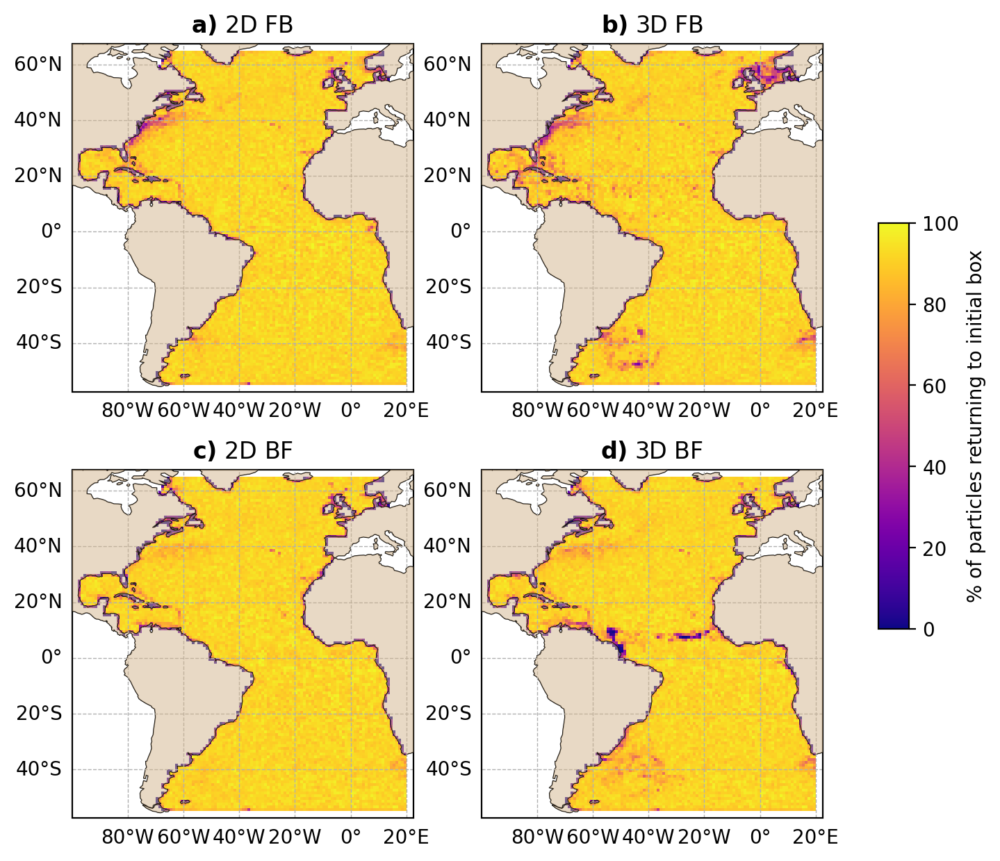

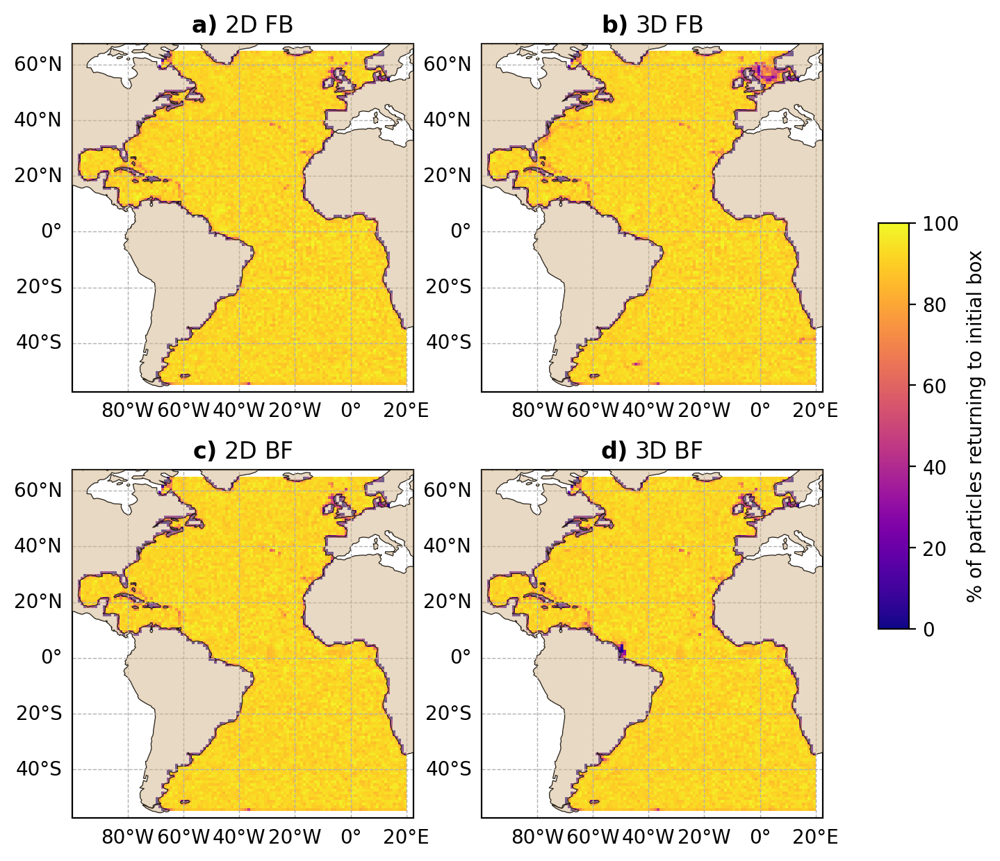

In [56]:
for timescale in [180, 90, 30, 10]:
    fig, axes = plt.subplots(2, 2, figsize=(8, 7.3), subplot_kw={'projection': cart.crs.PlateCarree()})

    for i, ax in enumerate(axes.flatten()):
        ax.coastlines(color='black', linewidth=0.5)
        ax.add_feature(cart.feature.LAND, zorder=10, facecolor='tan', alpha=0.5)
        ax.gridlines(draw_labels=["left", "bottom"], linewidth=0.5, linestyle='--')
        ax.set_extent([-100, 22.5, -57.5, 67.5], crs=cart.crs.PlateCarree())
        ax.set_title(r"$\bf{" + f"{labels[i]}" + r"}$ ")

    for i, direction in enumerate(exp_direction):
        for j, dimension in enumerate(["2D", "3D"]):
            count_plot = axes[i, j].pcolormesh(LON, LAT, direction[dimension]['backward'][timescale]['counter_exact_grid'] / 144 * 100, cmap='plasma', transform=cart.crs.PlateCarree(), vmin=0, vmax=100)
            axes[i, j].set_title(axes[i,j].get_title() + f"{dimension} {direction_names[i]}")
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.3, 0.0275, 0.4])

    fig.colorbar(count_plot, cax=cbar_ax, label="% of particles returning to initial box")
    plt.savefig(f"figures/atlantic_exact_return_T{timescale}.png", dpi=300, bbox_inches='tight')
    plt.show()

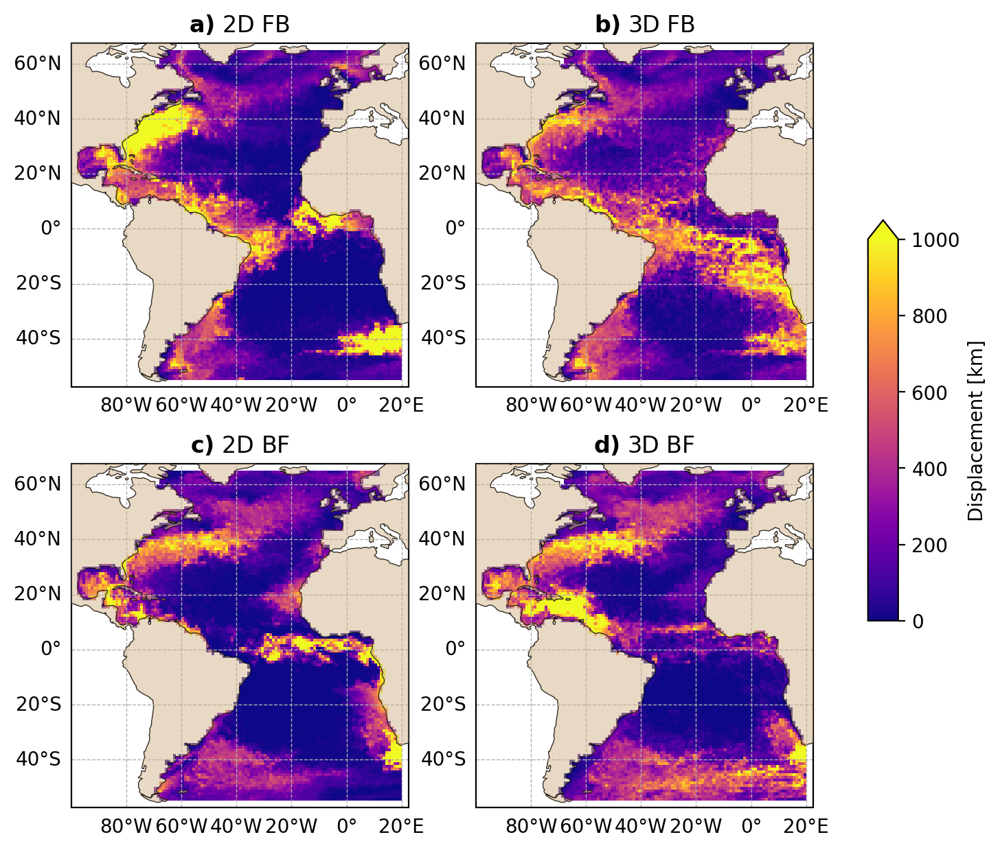

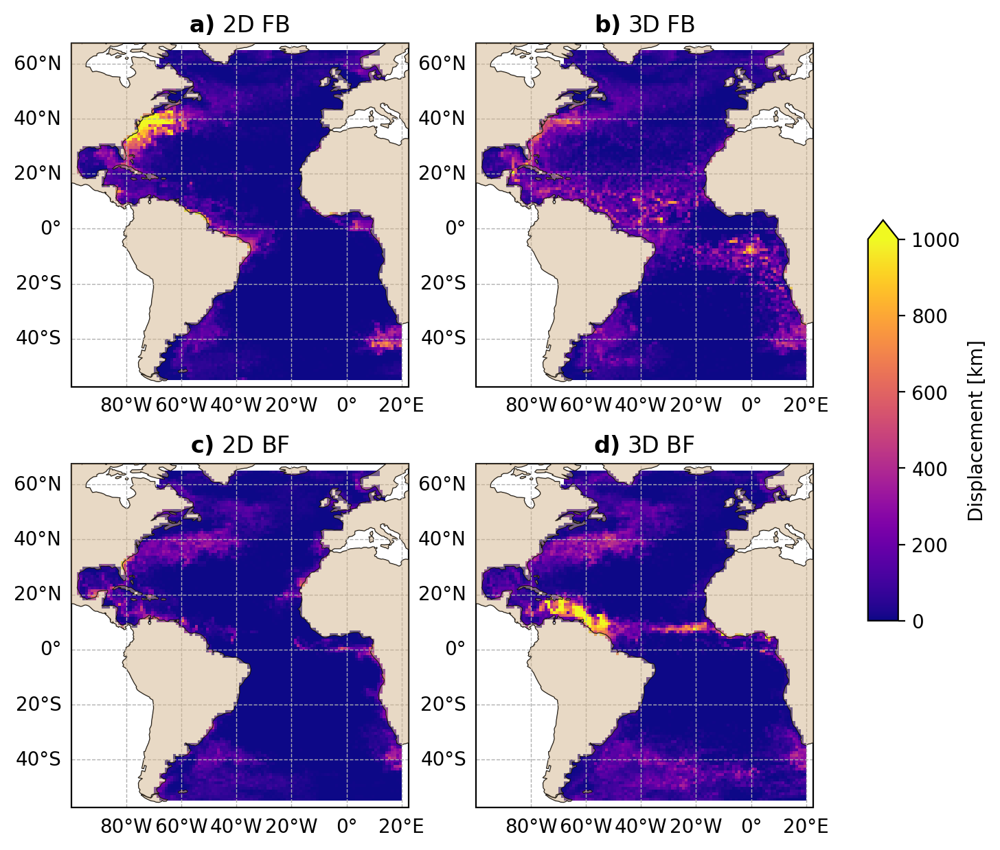

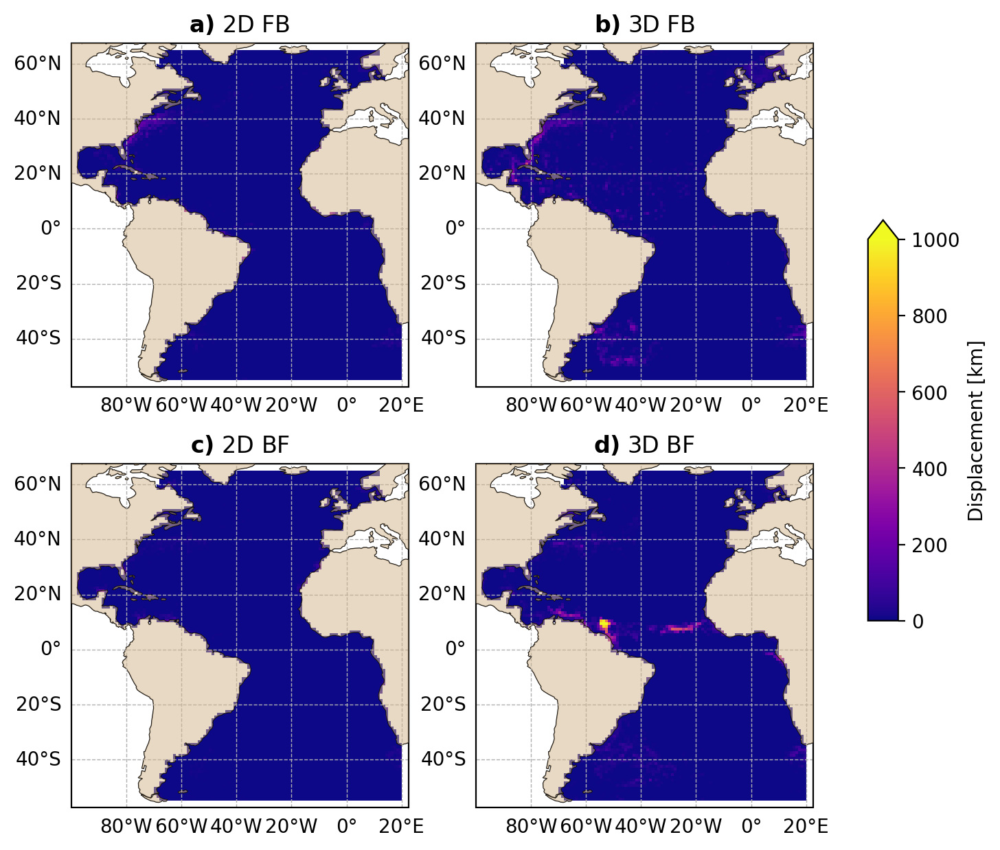

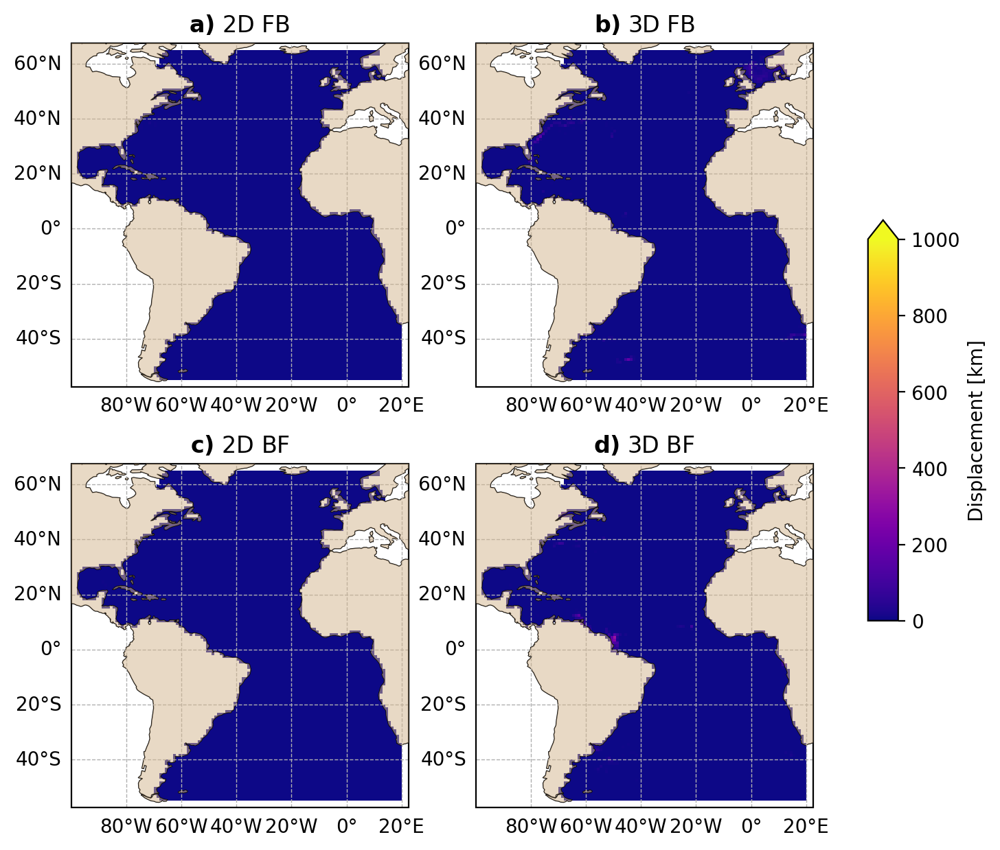

In [57]:
for timescale in [180, 90, 30, 10]:
    fig, axes = plt.subplots(2, 2, figsize=(8, 7.3), subplot_kw={'projection': cart.crs.PlateCarree()})

    for i, ax in enumerate(axes.flatten()):
        ax.coastlines(color='black', linewidth=0.5)
        ax.add_feature(cart.feature.LAND, zorder=10, facecolor='tan', alpha=0.5)
        ax.gridlines(draw_labels=["left", "bottom"], linewidth=0.5, linestyle='--')
        ax.set_extent([-100, 22.5, -57.5, 67.5], crs=cart.crs.PlateCarree())
        ax.set_title(r"$\bf{" + f"{labels[i]}" + r"}$ ")

    for i, direction in enumerate(exp_direction):
        for j, dimension in enumerate(["2D", "3D"]):
            count_plot = axes[i, j].pcolormesh(LON, LAT, direction[dimension]['backward'][timescale]['mean_distance'], cmap='plasma', transform=cart.crs.PlateCarree(), vmin=0, vmax=1000)
            axes[i, j].set_title(axes[i,j].get_title() + f"{dimension} {direction_names[i]}")
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.3, 0.0275, 0.4])
    fig.colorbar(count_plot, cax=cbar_ax, label="Displacement [km]", extend='max')

    plt.savefig(f"figures/atlantic_displacement_T{timescale}.png", dpi=300, bbox_inches='tight')
    plt.show()

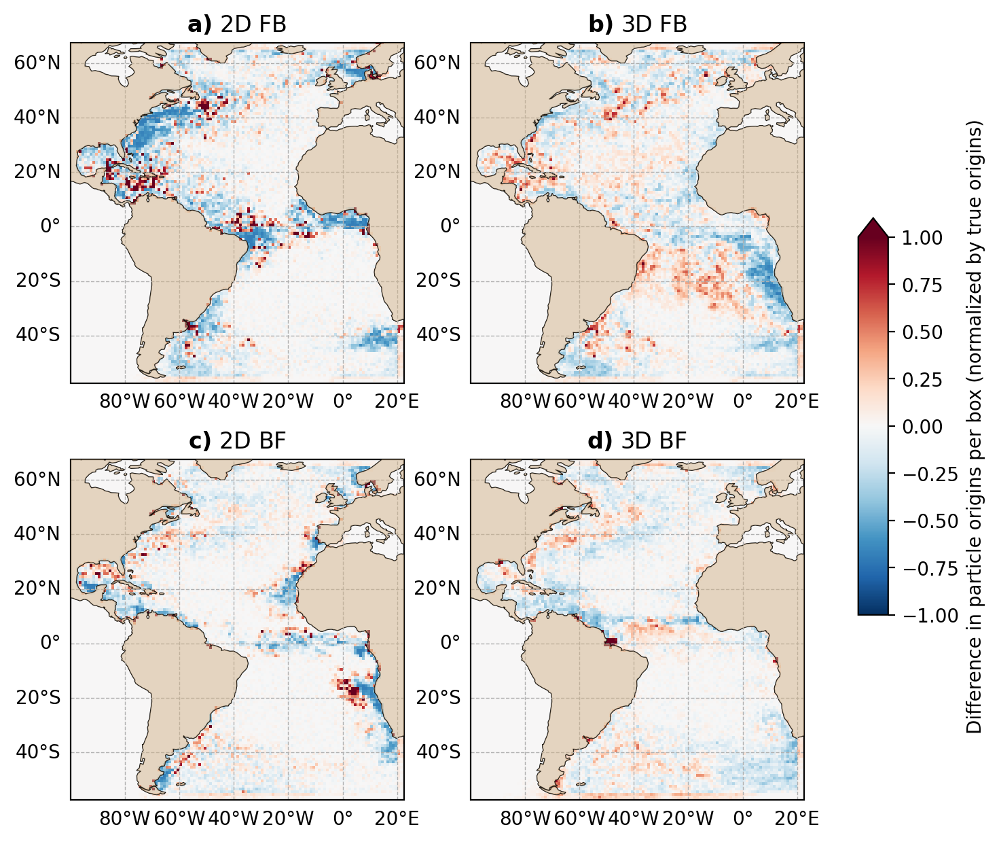

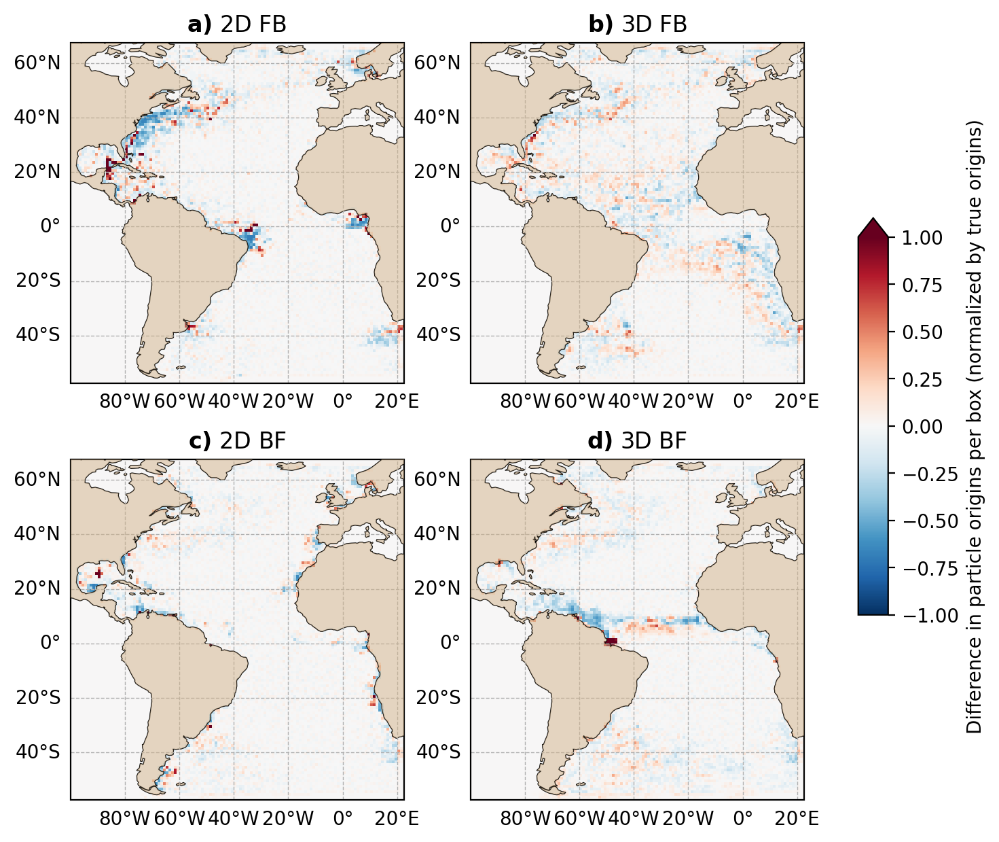

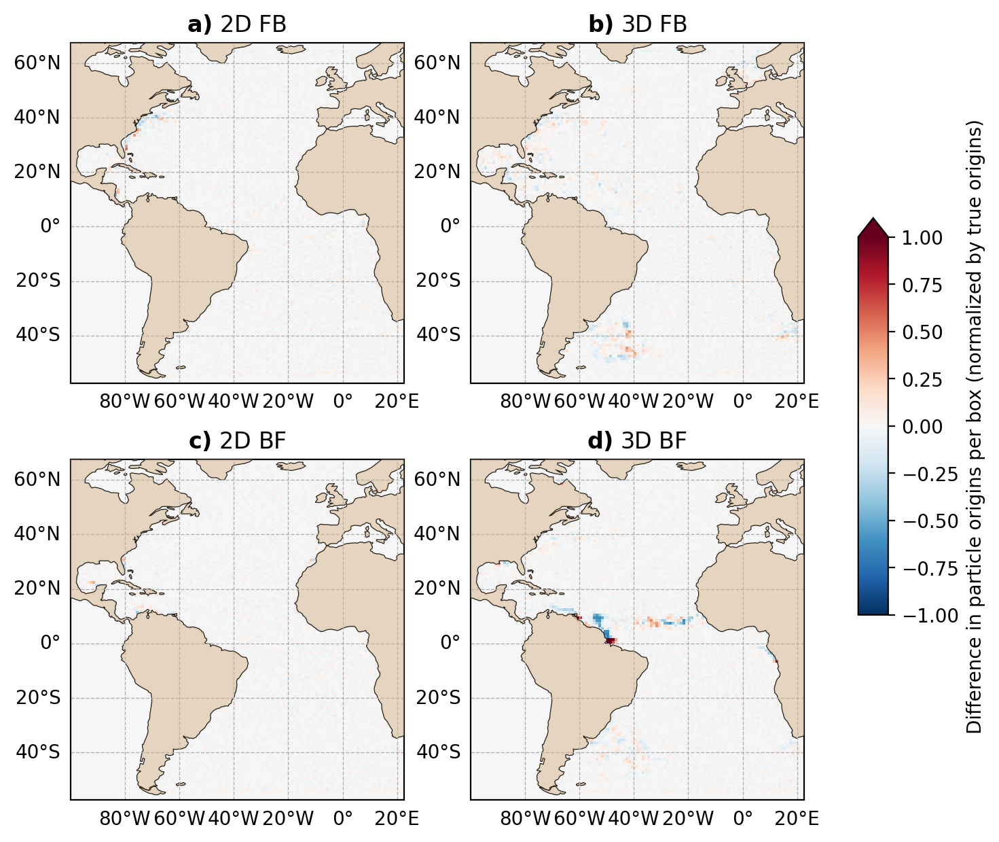

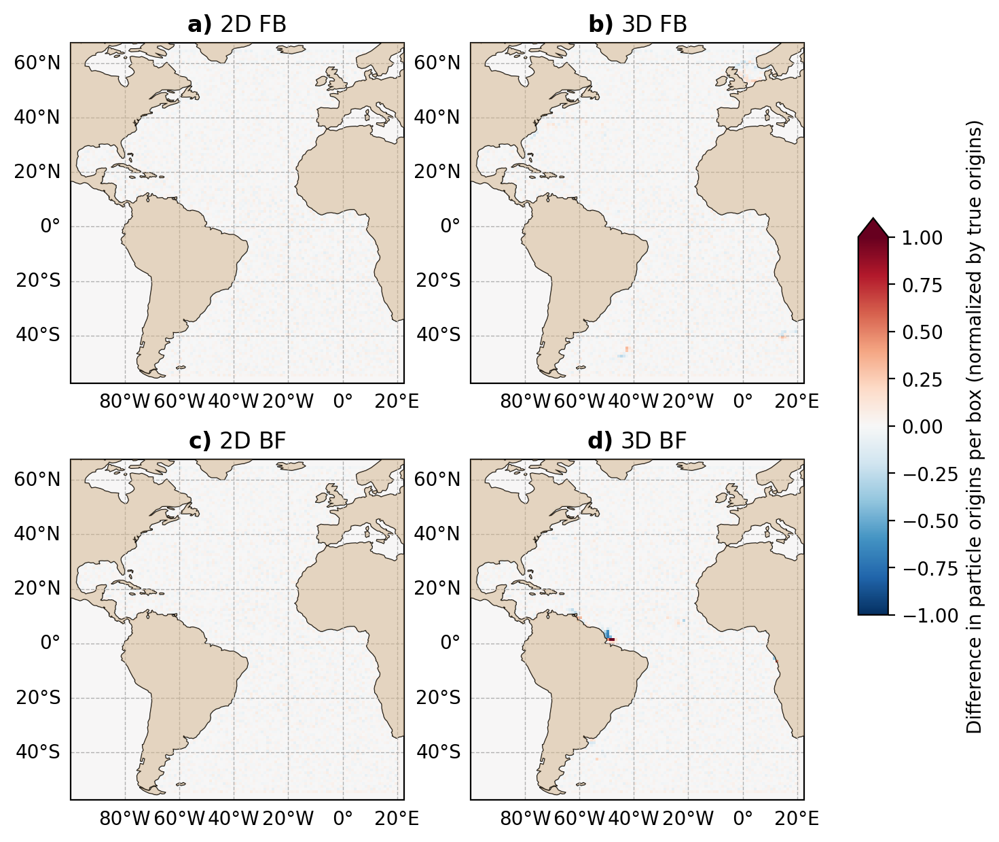

In [58]:
for timescale in [180, 90, 30, 10]:
    fig, axes = plt.subplots(2, 2, figsize=(8, 7.3), subplot_kw={'projection': cart.crs.PlateCarree()})

    for i, ax in enumerate(axes.flatten()):
        ax.coastlines(color='black', linewidth=0.5)
        ax.add_feature(cart.feature.LAND, zorder=10, facecolor='tan', alpha=0.5)
        ax.gridlines(draw_labels=["left", "bottom"], linewidth=0.5, linestyle='--')
        ax.set_extent([-100, 22.5, -57.5, 67.5], crs=cart.crs.PlateCarree())
        ax.set_title(r"$\bf{" + f"{labels[i]}" + r"}$ ")

    for i, direction in enumerate(exp_direction):
        for j, dimension in enumerate(["2D", "3D"]):
            count_plot = axes[i, j].pcolormesh(LON, LAT, direction[dimension]['backward'][timescale]['lossgain']/144 * 100, cmap='RdBu_r', transform=cart.crs.PlateCarree(), vmin=-1, vmax=1)
            axes[i, j].set_title(axes[i,j].get_title() + f"{dimension} {direction_names[i]}")
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.3, 0.0275, 0.4])
    fig.colorbar(count_plot, cax=cbar_ax, label="Difference in particle origins per box (normalized by true origins)", extend='max')

    plt.savefig(f"figures/atlantic_lossgain_T{timescale}.png", dpi=300, bbox_inches='tight')
    plt.show()


# Statistics

In [18]:
# del ds_3d_forward_nocoast
# del ds_3d_backward_180_nocoast
# del ds_3d_backward_90_nocoast
# del ds_3d_backward_30_nocoast
# del ds_3d_backward_10_nocoast

In [ ]:
# del ds_2d_backward_90_nocoast
# del ds_2d_backward_30_nocoast
# del ds_2d_backward_10_nocoast

In [161]:
def find_matching_time_idx(ds_forward, ds_backward):
    """
    Given two datasets, one forward and one backwards,
    find the `obs` indices in each dataset to create the largest
    possible dataset of matched observations (matched using the time coordinate).
    """

    forward_mintime = ds_forward.time.min()
    forward_maxtime = ds_forward.time.max()
    backward_mintime = ds_backward.time.min()
    backward_maxtime = ds_backward.time.max()

    mintime = max(forward_mintime, backward_mintime)
    maxtime = min(forward_maxtime, backward_maxtime)

    # find the indices of the observations in each dataset that are within the time range
    forward_indices = np.where((ds_forward.time >= mintime) & (ds_forward.time <= maxtime))[0]
    backward_indices = np.where((ds_backward.time >= mintime) & (ds_backward.time <= maxtime))[0]

    return forward_indices, backward_indices


In [162]:
def match_ds_and_resort(ds_forward, ds_backward, obs_from_end=True, sort_by_end=True):
    """
    Given two datasets, one forward and one backwards,
    find the overlapping observations and return two new datasets
    with the observations sorted in time.
    """
    
    forward_indices, backward_indices = find_matching_time_idx(ds_forward, ds_backward)
    
    # create new datasets with the observations sorted in time
    ds_forward_sorted = ds_forward.isel(obs=forward_indices).sortby("time")
    ds_backward_sorted = ds_backward.isel(obs=backward_indices).sortby("time")
    
    assert np.all(ds_forward_sorted.time.values == ds_backward_sorted.time.values), f"The time coordinates of the forward and backward datasets are not the same. {ds_forward_sorted.time.values} != {ds_backward_sorted.time.values}"

    assert np.all(ds_forward_sorted.isel(obs=-1).lon == ds_backward_sorted.isel(obs=-1).lon) and \
           np.all(ds_forward_sorted.isel(obs=-1).lat == ds_backward_sorted.isel(obs=-1).lat)


    if obs_from_end:
       obs_from_end_array = np.arange(len(ds_forward_sorted.time))[::-1]
       ds_forward_sorted = ds_forward_sorted.assign(obs_from_end=("obs", obs_from_end_array))
       ds_backward_sorted = ds_backward_sorted.assign(obs_from_end=("obs", obs_from_end_array))
       ds_forward_sorted = ds_forward_sorted.set_coords("obs_from_end")
       ds_backward_sorted = ds_backward_sorted.set_coords("obs_from_end")

       if sort_by_end:
           ds_forward_sorted = ds_forward_sorted.sortby("obs_from_end")
           ds_backward_sorted = ds_backward_sorted.sortby("obs_from_end")

    return ds_forward_sorted, ds_backward_sorted

In [163]:
ds_forward_nocoast_sub, ds_backward_nocoast_sub = match_ds_and_resort(ds_2d_forward_nocoast, ds_2d_backward_180_nocoast)

In [164]:
def add_dlons(ds):
    ds['dlon_m_large'] = np.cos(np.radians(ds['lat'])) * np.radians(1/24 * 2) * 6371000
    ds['dlon_m_medium'] = np.cos(np.radians(ds['lat'])) * np.radians(1/96 * 2) * 6371000
    ds['dlon_m_small'] = np.cos(np.radians(ds['lat'])) * np.radians(1/384 * 2) * 6371000
    return ds


In [165]:
ds_forward_nocoast_sub = add_dlons(ds_forward_nocoast_sub) 
ds_backward_nocoast_sub = add_dlons(ds_backward_nocoast_sub)

In [166]:
dlat_m_large = np.radians(1/24 * 2) * 6371000
dlat_m_medium = np.radians(1/96 * 2) * 6371000
dlat_m_small = np.radians(1/384 * 2) * 6371000

In [167]:
def great_circle_distance(lon1, lon2, lat1, lat2):
    """
    Compute the great circle distance between two points on a sphere.
    
    Parameters
    ----------
    lon1 : float, array-like
        Longitude of the first point.
    lon2 : float, array-like
        Longitude of the second point.
    lat1 : float, array-like
        Latitude of the first point.
    lat2 : float, array-like
        Latitude of the second point.

    Returns
    -------
    distance : float, array-like
        Great circle distance between the two points in meters.
    """

    identical = (lon1 == lon2) * (lat1 == lat2)

    inner = np.sin(np.radians(lat1)) * np.sin(np.radians(lat2)) + \
            np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * \
            np.cos(np.radians(lon2 - lon1))

    inner = np.clip(inner, -1, 1)

    dist = np.arccos(inner) * 6371000
    dist = np.where(identical, 0, dist)
    return dist

def find_dist(ds_forward, ds_backward):
    assert ds_forward.dims == ds_backward.dims, "The datasets must have the same dimensions."
    assert np.all(ds_forward.time.values == ds_backward.time.values), "The datasets must have the same time coordinates."
    assert np.all(ds_forward.isel(obs=0).lon == ds_backward.isel(obs=0).lon) and \
           np.all(ds_forward.isel(obs=0).lat == ds_backward.isel(obs=0).lat), "The datasets must have the same starting location."


    # compute the great circle distance between the forward and backward trajectories
    dist = great_circle_distance(ds_forward.lon.values, ds_backward.lon.values, ds_forward.lat.values, ds_backward.lat.values)

    # add the distance array to a new dataset with the same dimensions as the original datasets
    ds_dist = xr.Dataset()
    ds_dist["dist"] = xr.DataArray(dist, dims=ds_forward.dims, coords=ds_forward.coords)


    return ds_dist.sortby("obs_from_end")
    
def find_obs_dist_threshold(ds_forward, ds_backward, threshold= 1e4):
    ds_dist = find_dist(ds_forward, ds_backward)
    obs_dist_threshold = (ds_dist.dist < threshold).argmin(dim="obs")
    obs_dist_threshold = obs_dist_threshold.where(obs_dist_threshold > 0, -1)
    return obs_dist_threshold

In [168]:
def compute_div_curl_offline(ds):
    ds['div_linear'] = ds.dudx_linear + ds.dvdy_linear
    ds['curl_linear'] = ds.dvdx_linear - ds.dudy_linear
    ds['sum_derivatives'] = np.abs(ds.dudx_linear) + np.abs(ds.dudy_linear) + np.abs(ds.dvdx_linear) + np.abs(ds.dvdy_linear)
    return ds

In [169]:
ds_forward_nocoast_sub = compute_div_curl_offline(ds_forward_nocoast_sub)
ds_backward_nocoast_sub = compute_div_curl_offline(ds_backward_nocoast_sub)

In [170]:
def compute_max_cumsum(da_forward, da_backward):
    """
    Element-wise maximum of the cumulative sum of two datasets.
    """
    cumsum_forward = np.abs(da_forward).cumsum(dim='obs')
    cumsum_backward = np.abs(da_backward).cumsum(dim='obs')

    max_cumsum = np.maximum(cumsum_forward.values, cumsum_backward.values)

    da_cumsum = xr.DataArray(max_cumsum, dims=da_forward.dims, coords=da_forward.coords)

    return da_cumsum
def compute_avg_max_cumsum(arr_forward, arr_backward, mode = 'avg'):
    """
    Compute the average, or point-wise maximum of two datasets. Then compute the cumulative sum.
    """
    if mode == 'avg':
        avg = (np.abs(arr_forward).values + np.abs(arr_backward)).values / 2
        cumsum = avg.cumsum(axis=1)
    elif mode == 'max':
        maxarray = np.maximum(np.abs(arr_forward).values, np.abs(arr_backward).values)
        cumsum = maxarray.cumsum(axis=1)

    da_cumsum = xr.DataArray(cumsum, dims=arr_forward.dims, coords=arr_forward.coords)

    return da_cumsum

In [171]:
def plot_correlation(x, y, ax=None, title=None, xlabel=None, ylabel=None, addcorr=True, returnfig=True, **kwargs):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    mask = np.isfinite(x) & np.isfinite(y)
    correlation = np.corrcoef(x[mask], y[mask])[0, 1]
    ax.scatter(x, y, **kwargs)
    if xlabel is not None:
        ax.set_xlabel(xlabel)
    if ylabel is not None:
        ax.set_ylabel(ylabel)
    if title is not None:
        ax.set_title(title)
        if addcorr:
            ax.set_title(f"{title}\nCorrelation: {correlation:.2f}")
    else:
        ax.set_title(f"Correlation: {correlation:.2f}")
    ax.grid(True)
    fig.tight_layout()
    if returnfig:
        print(correlation)
        return fig, ax
    else:
        plt.show()
        return correlation

In [172]:
def plot_correlation_hist2d(x, y, ax=None, title=None, xlabel=None, ylabel=None, addcorr=True, returnfig=True, **kwargs):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(5, 4))
    mask = np.isfinite(x) & np.isfinite(y)
    correlation = np.corrcoef(x[mask], y[mask])[0, 1]
    hist = ax.hist2d(x[mask], y[mask], **kwargs)
    if xlabel is not None:
        ax.set_xlabel(xlabel)
    if ylabel is not None:
        ax.set_ylabel(ylabel)
    if title is not None:
        ax.set_title(title)
        if addcorr:
            ax.set_title(f"{title}\nCorrelation: {correlation:.2f}")
    else:
        ax.set_title(f"Correlation: {correlation:.2f}")
    # ax.grid(True)
    fig.colorbar(hist[3], ax=ax, label='Count')
    fig.tight_layout()
    if returnfig:
        print(correlation)
        return fig, ax
    else:
        plt.show()
        return correlation

In [173]:
NA_dist = find_dist(ds_forward_nocoast_sub, ds_backward_nocoast_sub)
dist_cumsum = NA_dist.dist.cumsum(dim="obs")

/nethome/4302001/miniconda3/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


0.6129715726611668


(0.0, 0.0006)

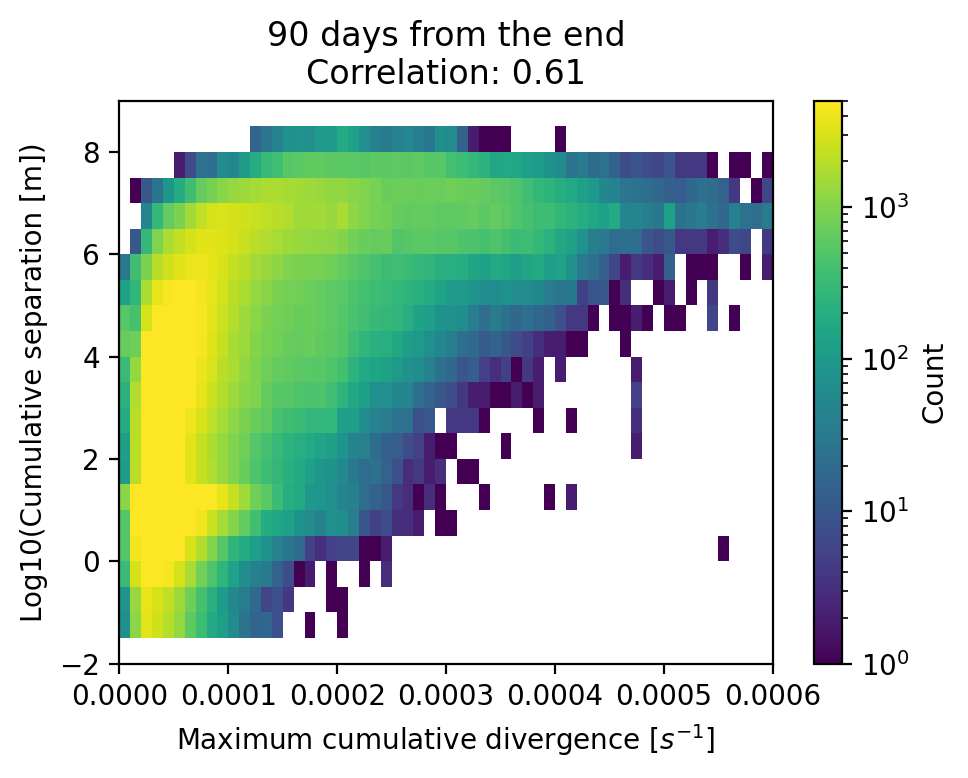

In [174]:
fig, ax = plot_correlation_hist2d(x=compute_max_cumsum(ds_forward_nocoast_sub.div_linear, ds_backward_nocoast_sub.div_linear).isel(obs=90).values, 
                 y=np.log10(dist_cumsum.isel(obs=90)),
                 xlabel = "Maximum cumulative divergence [$s^{-1}$]",
                 ylabel = "Log10(Cumulative separation [m])", 
                 title = f"90 days from the end",
                 bins=[np.arange(0, 0.00066, 0.00001), np.arange(-2, 9.5, 0.5)],
                 norm=mcolors.LogNorm(vmin=1, vmax=5000), cmap='viridis', cmin=1
                 )
ax.set_xlim(0, 0.0006)

/nethome/4302001/miniconda3/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


0.5869090204926523


(0.0, 0.0006)

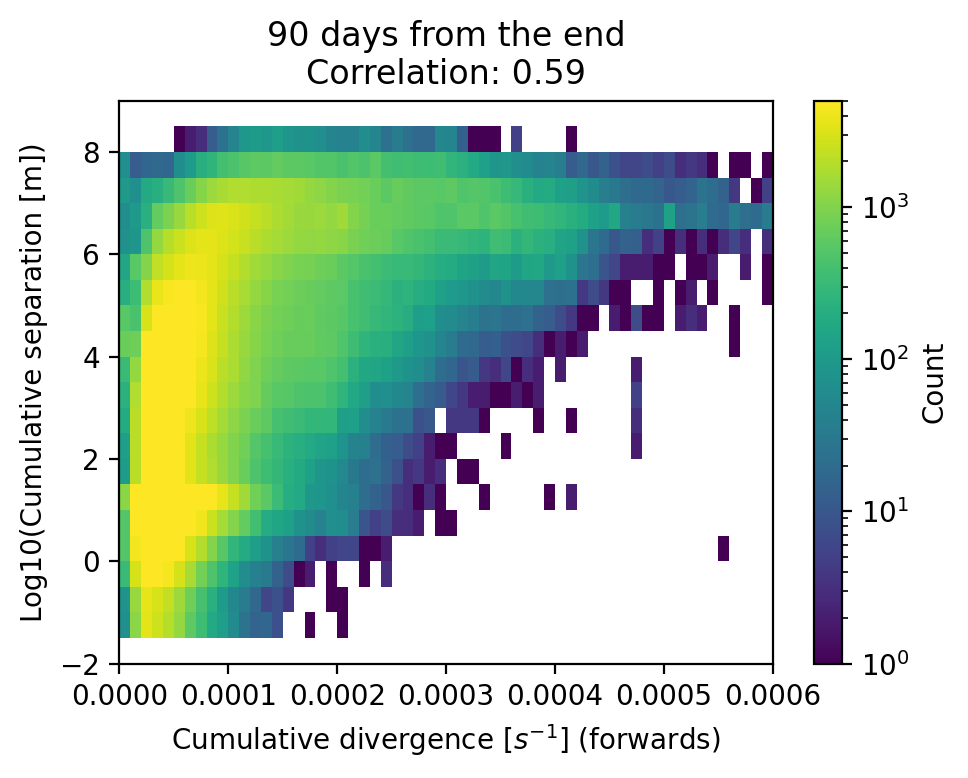

In [175]:
fig, ax = plot_correlation_hist2d(x=np.abs(ds_forward_nocoast_sub.div_linear).cumsum(dim='obs').isel(obs=90), 
                 y=np.log10(dist_cumsum.isel(obs=90)),
                 xlabel = "Cumulative divergence [$s^{-1}$] (forwards)",
                 ylabel = "Log10(Cumulative separation [m])", 
                 title = f"90 days from the end",
                 bins=[np.arange(0, 0.00066, 0.00001), np.arange(-2, 9.5, 0.5)],
                 norm=mcolors.LogNorm(vmin=1, vmax=5000), cmap='viridis', cmin=1
                 )
ax.set_xlim(0, 0.0006)

/nethome/4302001/miniconda3/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


0.5954418633042091


(0.0, 0.003)

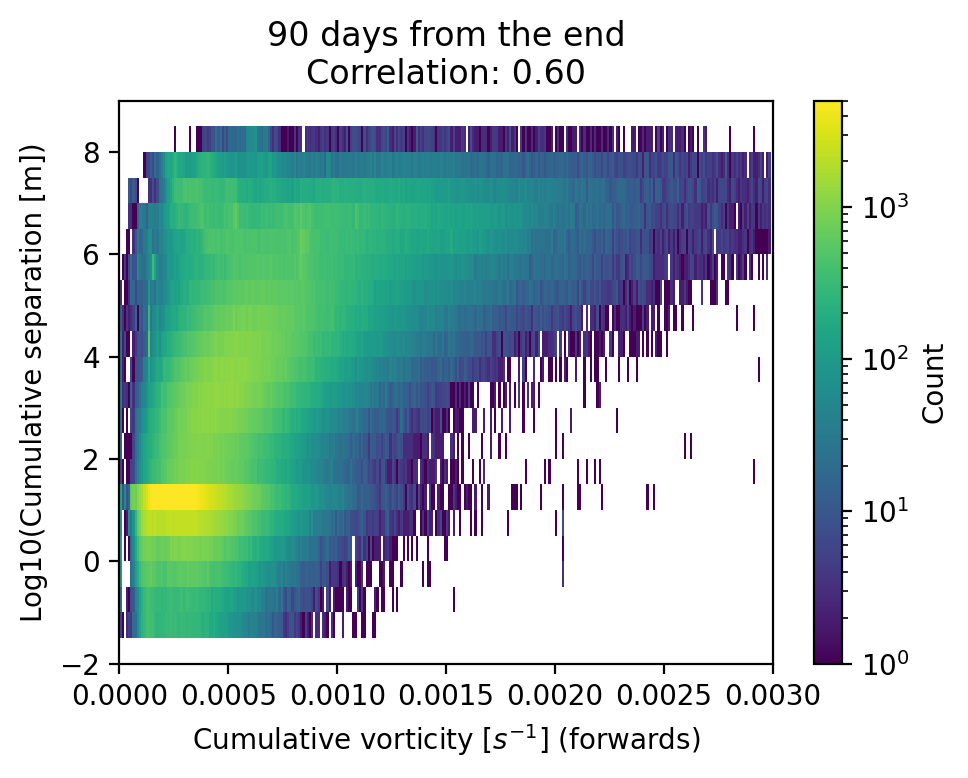

In [176]:
fig, ax = plot_correlation_hist2d(x=np.abs(ds_forward_nocoast_sub.curl_linear).cumsum(dim='obs').isel(obs=90), 
                 y=np.log10(dist_cumsum.isel(obs=90)),
                 xlabel = "Cumulative vorticity [$s^{-1}$] (forwards)",
                 ylabel = "Log10(Cumulative separation [m])", 
                 title = f"90 days from the end",
                 bins=[np.arange(0, 0.003, 0.00001), np.arange(-2, 9.5, 0.5)],
                 norm=mcolors.LogNorm(vmin=1, vmax=5000), cmap='viridis', cmin=1
                 )
ax.set_xlim(0, 0.003)

/nethome/4302001/miniconda3/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


0.6804127540867401


(0.0, 0.006)

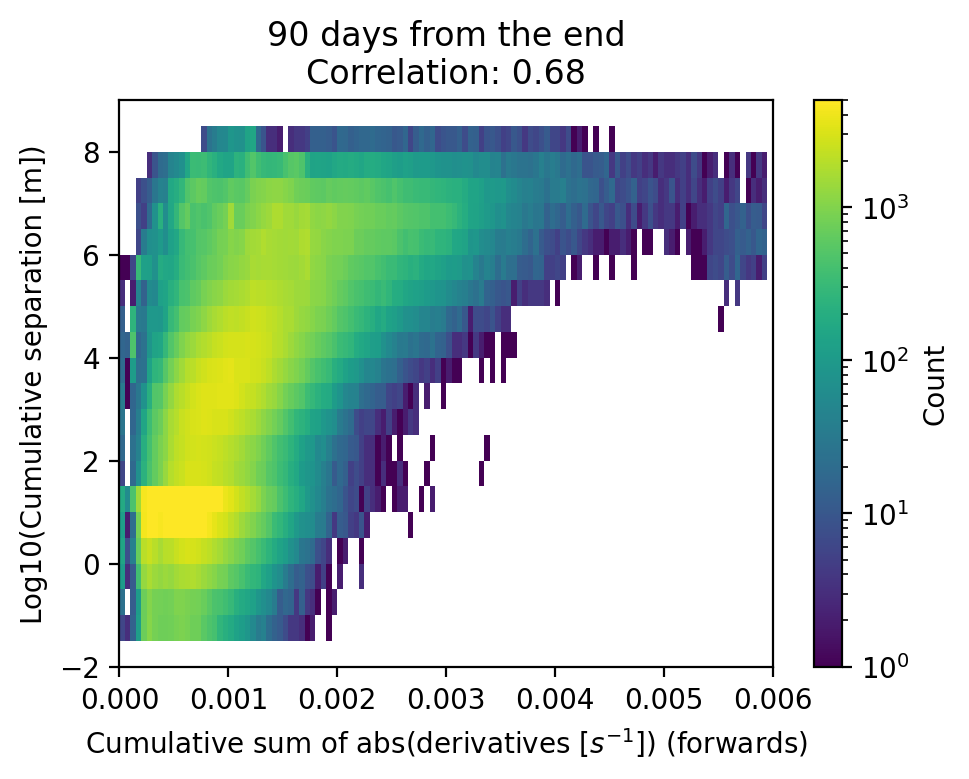

In [177]:
fig, ax = plot_correlation_hist2d(x=np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs').isel(obs=90), 
                 y=np.log10(dist_cumsum.isel(obs=90)),
                 xlabel = "Cumulative sum of abs(derivatives [$s^{-1}$]) (forwards)",
                 ylabel = "Log10(Cumulative separation [m])", 
                 title = f"90 days from the end",
                 bins=[np.arange(0, 0.006, 0.00005), np.arange(-2, 9.5, 0.5)],
                 norm=mcolors.LogNorm(vmin=1, vmax=5000), cmap='viridis', cmin=1
                 )
ax.set_xlim(0, 0.006)

In [179]:
# suppress runtime warning
warnings.filterwarnings('ignore')

best_index = 0
best_correlation = 0
for i in tqdm.tqdm(range(1, 90)):
    x = np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs').isel(obs=i)
    y = np.log(dist_cumsum.isel(obs=i))
    mask = np.isfinite(x) & np.isfinite(y)
    correlation = np.corrcoef(x[mask], y[mask])[0, 1]
    if correlation > best_correlation:
        best_correlation = correlation
        best_index = i

print(f"{best_index=}, {best_correlation=}")

# re-enable runtime warning
warnings.filterwarnings('default')

100%|██████████| 89/89 [03:00<00:00,  2.03s/it]

best_index=89, best_correlation=0.6799502673587139


In [180]:
never_coastal = ~((ds_forward_nocoast_sub.coastal == 1).any('obs') + (ds_backward_nocoast_sub.coastal == 1).any('obs'))

In [181]:
# now exclude coastal trajectories
# suppress runtime warning
warnings.filterwarnings('ignore')

best_index = 0
best_correlation = 0
for i in tqdm.tqdm(range(1, 90)):
    x = np.abs(ds_forward_nocoast_sub.div_linear).cumsum(dim='obs').isel(obs=i)[never_coastal]
    y = np.log(dist_cumsum.isel(obs=i)[never_coastal])
    mask = np.isfinite(x) & np.isfinite(y)
    correlation = np.corrcoef(x[mask], y[mask])[0, 1]
    if correlation > best_correlation:
        best_correlation = correlation
        best_index = i

print(f"{best_index=}, {best_correlation=}")

# re-enable runtime warning
warnings.filterwarnings('default')

100%|██████████| 89/89 [03:02<00:00,  2.05s/it]

best_index=89, best_correlation=0.5035739805442343


In [182]:
def find_obs_dist_threshold(ds_forward, ds_backward, threshold= 1e2):
    ds_dist = find_dist(ds_forward, ds_backward)
    obs_dist_threshold = (ds_dist.dist < threshold).argmin(dim="obs")
    obs_dist_threshold = obs_dist_threshold.where(obs_dist_threshold > 0, -1)
    return obs_dist_threshold

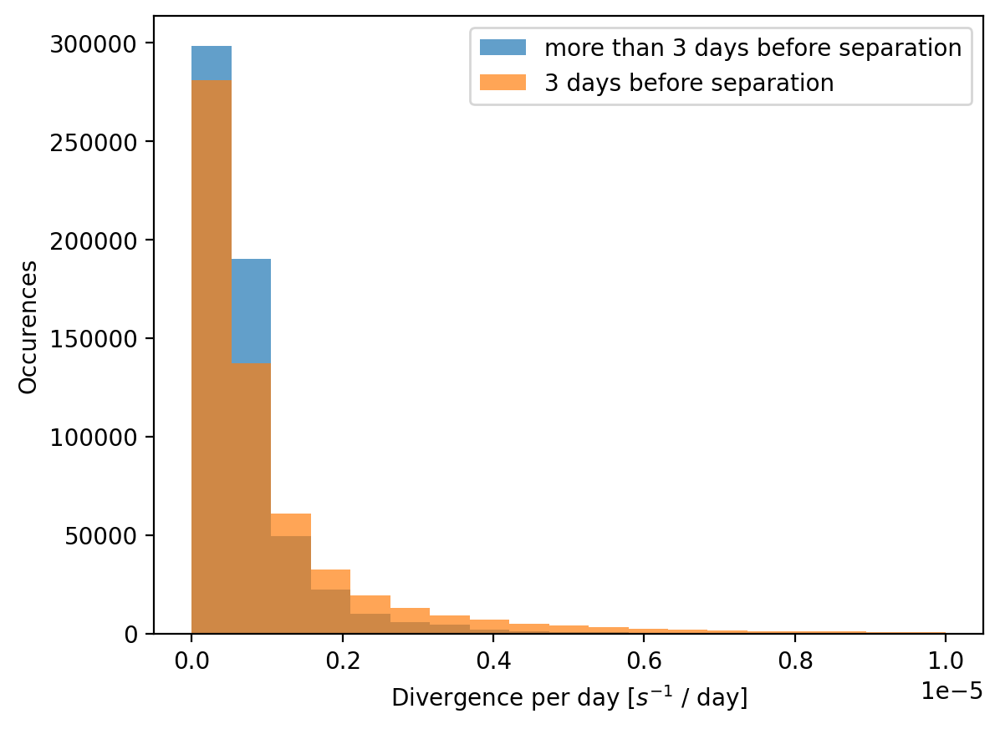

In [183]:
obs_has_seperated = find_obs_dist_threshold(ds_forward_nocoast_sub, ds_backward_nocoast_sub, 1e-1)

min_length = 6
keep_filter = obs_has_seperated > min_length
np.abs(ds_forward_nocoast_sub.div_linear).cumsum(dim='obs')

separation_period = min_length//2
cumsum = np.abs(ds_forward_nocoast_sub.div_linear).cumsum(dim='obs')
first_leg = cumsum.isel(obs=obs_has_seperated-separation_period).where(keep_filter)
second_leg = cumsum.isel(obs=obs_has_seperated).where(keep_filter) - first_leg

first_leg_per_day = first_leg / (obs_has_seperated.where(keep_filter) - separation_period)
second_leg_per_day = second_leg / (separation_period)

plt.hist(first_leg_per_day, bins=np.linspace(0, 1e-5, 20), label=f"more than {separation_period} days before separation", alpha=0.7)
plt.hist(second_leg_per_day, bins=np.linspace(0, 1e-5, 20), label=f"{separation_period} days before separation", alpha=0.7)
plt.xlabel("Divergence per day [$s^{-1}$ / day]")
plt.ylabel("Occurences")
plt.legend()
plt.show()

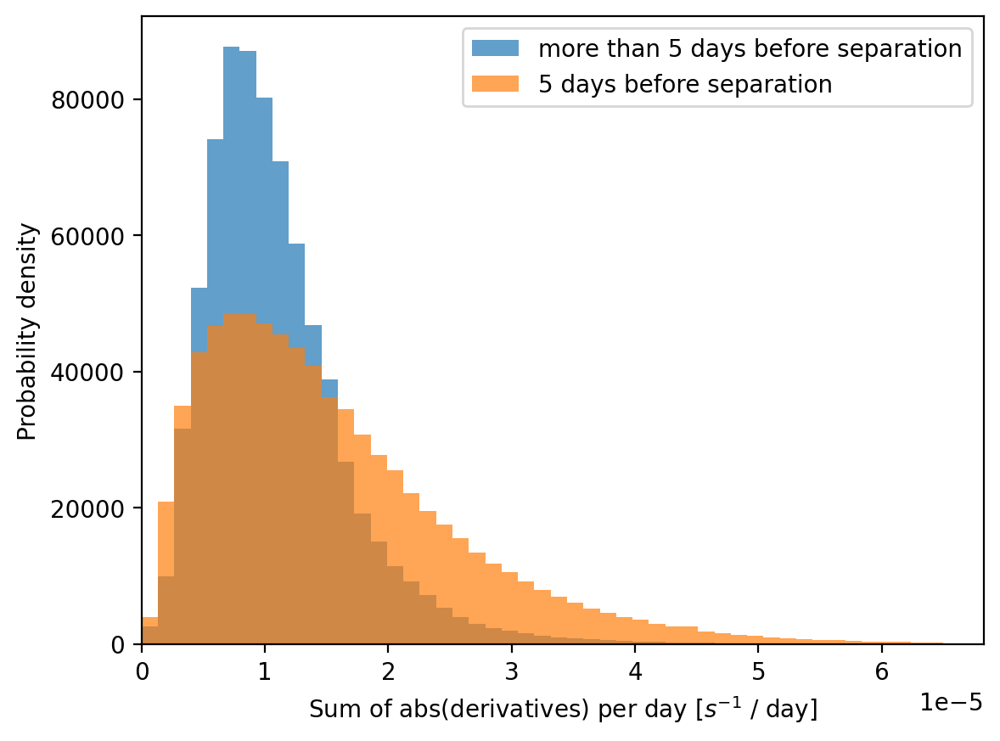

In [184]:
obs_has_seperated = find_obs_dist_threshold(ds_forward_nocoast_sub, ds_backward_nocoast_sub, 1e-1)

min_length = 10
keep_filter = obs_has_seperated > min_length
np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs')

separation_period = min_length//2
cumsum = np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs')
first_leg = cumsum.isel(obs=obs_has_seperated-separation_period).where(keep_filter)
second_leg = cumsum.isel(obs=obs_has_seperated).where(keep_filter) - first_leg

first_leg_per_day = first_leg / (obs_has_seperated.where(keep_filter) - separation_period)
second_leg_per_day = second_leg / (separation_period)

plt.hist(first_leg_per_day, bins=np.linspace(0, 6.5e-5, 50), label=f"more than {separation_period} days before separation", alpha=0.7, density=True)
plt.hist(second_leg_per_day, bins=np.linspace(0, 6.5e-5, 50), label=f"{separation_period} days before separation", alpha=0.7, density=True)
plt.xlabel("Sum of abs(derivatives) per day [$s^{-1}$ / day]")
plt.xlim(0, None)
plt.ylabel("Probability density")
plt.legend()
plt.show()

## Combined figure

/nethome/4302001/miniconda3/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/tmp/ipykernel_21176/3129198566.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_yticklabels([f"$10^{{{int(tick)}}}$" for tick in axes[0].get_yticks()])


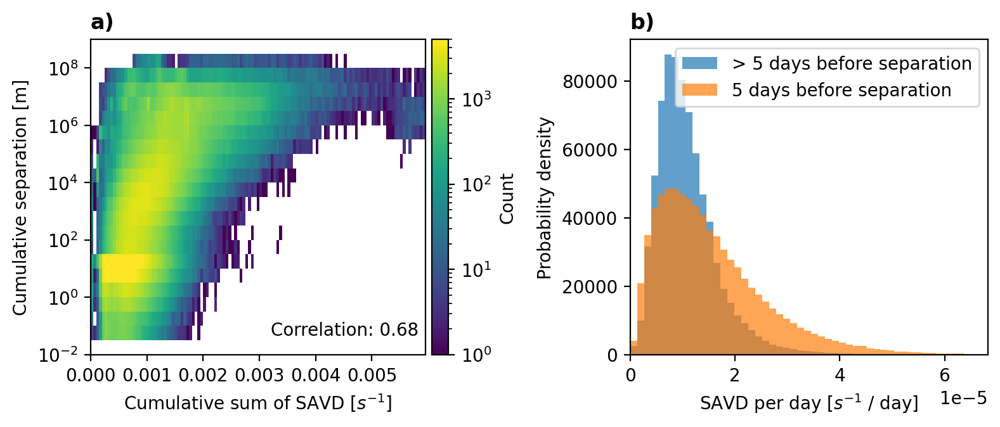

In [215]:
fig, axes = plt.subplots(1, 2, figsize=(8, 3.5))
x=np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs').isel(obs=90)
y=np.log10(dist_cumsum.isel(obs=90))

mask = np.isfinite(x) & np.isfinite(y)
correlation = np.corrcoef(x[mask], y[mask])[0, 1]
hist = axes[0].hist2d(x[mask], y[mask], bins=[np.arange(0, 0.006, 0.00005), np.arange(-2, 9.5, 0.5)],
                 norm=mcolors.LogNorm(vmin=1, vmax=5000), cmap='viridis', cmin=1)
axes[0].set_xlabel("Cumulative sum of SAVD [$s^{-1}$]")
axes[0].set_ylabel("Cumulative separation [m]")
axes[0].set_yticklabels([f"$10^{{{int(tick)}}}$" for tick in axes[0].get_yticks()])
axes[0].text(0.98, 0.05, f"Correlation: {correlation:.2f}", transform=axes[0].transAxes, ha='right', va='bottom')

# plot a colorbar on the right of this axis, steal some space from this axis
divider = make_axes_locatable(axes[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(hist[3], cax=cax, orientation='vertical', label='Count')

for i, ax in enumerate(axes.flatten()):
    ax.text(0, 1.02, f"{chr(97+i)})", transform=ax.transAxes, fontsize=12, fontweight='bold', va='bottom')

# obs_has_seperated = find_obs_dist_threshold(ds_forward_nocoast_sub, ds_backward_nocoast_sub, 1e-1)
# min_length = 10
# keep_filter = obs_has_seperated > min_length
# np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs')
# separation_period = min_length//2
# cumsum = np.abs(ds_forward_nocoast_sub.sum_derivatives).cumsum(dim='obs')
# first_leg = cumsum.isel(obs=obs_has_seperated-separation_period).where(keep_filter)
# second_leg = cumsum.isel(obs=obs_has_seperated).where(keep_filter) - first_leg
# first_leg_per_day = first_leg / (obs_has_seperated.where(keep_filter) - separation_period)
# second_leg_per_day = second_leg / (separation_period)

axes[1].hist(first_leg_per_day, bins=np.linspace(0, 6.5e-5, 50), label=f"> {separation_period} days before separation", alpha=0.7, density=True)
axes[1].hist(second_leg_per_day, bins=np.linspace(0, 6.5e-5, 50), label=f"{separation_period} days before separation", alpha=0.7, density=True)
axes[1].set_xlabel("SAVD per day [$s^{-1}$ / day]")
axes[1].set_xlim(0, None)
axes[1].set_ylabel("Probability density")
axes[1].legend()

plt.tight_layout()
plt.savefig("figures/SAVD_separation.png", dpi=300, bbox_inches='tight')
plt.show()